# CREDIT CARD DEFAULT ANALYSIS



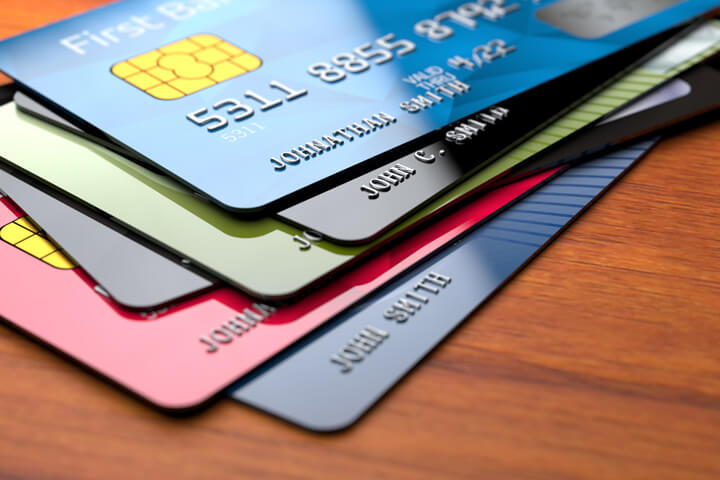


## Introducción

Existen clientes en el portafolio de tarjetas de crédito que empiezan a dejar de pagar sus deudas, cayendo en mora o finalmente en castigar el crédito. Es necesario poder aproximarnos al perfil de cliente que cae en default.

### Variables



*   CODMES: Señala el mes y año del registro
* CIF_KEY: Señala el código de registro interno del banco
* NROPROD: Código de producto del cliente(el cliente puede tener más de una tarjeta asociada a su CIF_KEY)
* FLG_DESEMBOLSO: 
* BM_30_12M: Flag que muestra si el cliente tiene en algún mes más de 30 días de mora en los últimos 12 meses.
* BM_15_12M: Flag que muestra si el cliente tiene en algún mes más de 15 días de mora en los últimos 12 meses.
* BM_30_6M: Flag que muestra si el cliente tiene en algún mes más de 30 días de mora en los últimos 6 meses.
* BM_15_6M: Flag que muestra si el cliente tiene en algún mes más de 15 días de mora en los últimos 6 meses.
* EDAD: edad del cliente
* EST_CIVIL: estado civil del cliente
* GENERO: género del cliente
* CODDOCC: dni del cliente
* CODCLIENTESBS: código del cliente en el RCC
* PRODUCTO: clasificación del producto del cliente
* SUBPRODUCTO: subclasificación del producto
* TRAMO: tramo en el cual se encuentra el cliente
* DEUDA: cantidad de deuda al mes
* TIPO_PRODUCTO: Tipo de producto
* D_VIG: deuda vigente del cliente
* REGION: código de la región del cliente
* DEPARTAMENTO: Código del departamento
* TIPO_CLIENTE_SEG: 
* SEGMENTO: segmentación interna
* SUBSEGMENTO: 
* TIPFLGDEPENDIENTE:
* TIPFLGPROPIETARIOCASA:
* TIPSITUACIONCASA: 
* TIPCLASIRIESGOSBS:
* TIPFLGPRODUCTOOTROBANCO
* MTODEUDAOTROBANCOSOL
* TIPNIVELEDUCACIONAL	
* CODPROFESION	
* DESTIPCARGO	
* CA_TIP_CONTRIBUYENTE	
* CA_SITUACION_LAB	
* NE_INGR_NETO_VIG	
* NE_INGR_BRUTO	
* NE_INGR_ACTIVO_IND	
* NIVELSCORE	
* PRODUCTOS	
* DI	
* MODELOSCORE_PP	
* MATRIZ_RIESGO	
* INGRESO_VIGENTE_ACOT	
* LINEA


### Meta y plan
Buscamos conocer el perfil de los clientes que caen en deafault. Para esto se hará un modelo predictivo de clasificación con el cual podremos predecir que clientes caerán en default o no y conocer que variables son las más importantes para esto.

In [2]:
#importamos las librerías a usar
import pandas as pd
import altair as alt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.express as px
import os
os.chdir('D:/interbank/pd_tc')
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 70)

In [3]:
#cargamos la base de datos
data = pd.read_csv('df_201906.csv', sep=';',encoding='latin')

In [4]:
#mostramos los 5 primeros registros
data.head()

,CODMES,CIF_KEY,NROPROD,FLG_DESEMBOLSO,BM_30_12M,BM_15_12M,BM_30_6M,BM_15_6M,EDAD,EST_CIVIL,GENERO,CODDOCC,CODCLIENTESBS,PRODUCTO,SUBPRODUCTO,TRAMO,DEUDA,TIPO_PRODUCTO,D_VIG,REGION,DEPARTAMENTO,TIPO_CLIENTE_SEG,SEGMENTO,SUBSEGMENTO,TIPFLGDEPENDIENTE,TIPFLGPROPIETARIOCASA,TIPSITUACIONCASA,TIPCLASIFRIESGOSBS,TIPFLGPRODUCTOOTROBANCO,MTODEUDAOTROBANCOSOL,TIPNIVELEDUCACIONAL,CODPROFESION,DESTIPCARGO,CA_TIP_CONTRIBUYENTE,CA_SITUACION_LAB,NE_INGR_NETO_VIG,NE_INGR_BRUTO,NE_INGR_ACTIVO_IND,NIVELSCORE,PRODUCTOS,DI,MODELOSCORE_PP,MATRIZ_RIESGO,INGRESO_VIGENTE_ACOT,LINEA,PROD_ANALYTICS,SUBPROD_ANALYTICS,TRAMO_ANALYTICS,TRAMO_MES_ANT,CLASIFICACION_FINAL,CLASIF_F_MES_ANT,DM_ANALYTICS,DM_MES_ANT,DEUDA_ANALYTICS,DEUDA_ANT,SIT_LABORAL_CASC,G_INGRESO,SCORE_TRANSX_TC,TASA_DET,CTDACTIVOS,CTDENTIDADES,ANTIGUEDAD_IBK,RANGO_ANTIG_IBK,ANTIGUEDAD_RCC,RANGO_ANTIG_RCC
0,201906,10801064,4764936,0,0,0,0,0,73.0,S,F,8269526,0015196157,01 Amex,Amex Platinum,Vig,1222.34,PREMIUM,1222.34,1,15,3,3,MICRO,S,N,FAMIL,0,N,0.00,17,COM,.,PERSONA NATURAL CON NEGOCIO,INDEPENDIENTE,3491.0,4363.0,3491.0,Medio,0,0.00,BANCARIZADO,ZONA 3,1740.0,1700.0,01 Amex,Amex Platinum,Vig,Vig,0,0.0,0,0.0,1222.34,1337.05,INDEPENDIENTE,"04. <=7,020",ALTO,02.MANTIENE,1,5.0,10.0,[10;+>,11.0,[6;+>
1,201906,9372852,6778851,0,0,0,0,0,44.0,S,M,32136876,0098850511,01 Visa,Visa Oro,Vig,20866.63,TRADICIONAL,20866.63,3,2,3,3,PNSN,S,N,FAMIL,3,S,8144.07,14,OTR,DEPENDIENTE,PERSONA NATURAL SIN NEGOCIO,MIXTO,3642.0,4552.0,3642.0,Medio,0,0.00,BANCARIZADO,ZONA 4,3484.0,1700.0,01 Visa,Visa Oro,Vig,Vig,0,0.0,0,0.0,20866.63,21172.84,MIXTO,"04. <=7,020",BAJO,02.MANTIENE,1,4.0,NaN,[0;1],6.0,[6;+>
2,201906,8724337,496540,0,0,0,0,0,45.0,C,F,7641892,.,01 Visa,Interbank Premia,Vig,154.97,TRADICIONAL,154.97,1,15,3,3,INFORMAL,.,.,.,.,N,0.00,.,.,.,NaN,INDEPENDIENTE,1827.0,2149.0,1827.0,Rechazo,0,0.00,HIT SIN INFORMACION/NO HIT,ZONA 4,2197.0,1000.0,01 Visa,Interbank Premia,Vig,Vig,0,0.0,0,0.0,154.97,154.98,INDEPENDIENTE,"04. <=7,020",MUY ALTO,02.MANTIENE,1,6.0,14.0,[10;+>,13.0,[6;+>
3,201906,14677929,4963078,0,0,0,0,0,34.0,S,M,44389896,0106700010,01 Amex,Amex Centurion Gold,Vig,10389.76,TRADICIONAL,10389.76,1,15,3,3,PNSN,.,N,FAMIL,0,S,8734.83,17,.,.,PERSONA NATURAL SIN NEGOCIO,MIXTO,1632.0,1875.0,1632.0,Medio,0,0.59,BANCARIZADO,ZONA 4,2491.0,1200.0,01 Amex,Amex Centurion Gold,Vig,1,0,1.0,0,15.0,10389.76,7521.38,MIXTO,"02. <=2,480",BAJO,01.RECUPERA,1,5.0,NaN,[0;1],NaN,[0]
4,201906,12259686,4263248,0,0,0,0,0,50.0,C,F,9608953,0107086013,01 Visa,Interbank Premia,Vig,1537.94,TRADICIONAL,1537.94,1,15,2,2,SIN SUBSEGMENTO,S,N,FAMIL,0,S,3487.16,17,PRF,DEPENDIENTE,PERSONA NATURAL SIN NEGOCIO,MIXTO,1632.0,1875.0,1632.0,Muy Alto,0,0.59,BANCARIZADO,ZONA 1,1867.0,6500.0,01 Visa,Interbank Premia,Vig,Vig,0,0.0,0,0.0,1537.94,1770.79,MIXTO,"02. <=2,480",ALTO,02.MANTIENE,1,2.0,8.0,[8;9],8.0,[6;+>


In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 940463 entries, 0 to 940462
Data columns (total 65 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   CODMES                   940463 non-null  int64  
 1   CIF_KEY                  940463 non-null  int64  
 2   NROPROD                  940463 non-null  int64  
 3   FLG_DESEMBOLSO           940463 non-null  int64  
 4   BM_30_12M                940463 non-null  int64  
 5   BM_15_12M                940463 non-null  int64  
 6   BM_30_6M                 940463 non-null  int64  
 7   BM_15_6M                 940463 non-null  int64  
 8   EDAD                     934846 non-null  float64
 9   EST_CIVIL                915829 non-null  object 
 10  GENERO                   934849 non-null  object 
 11  CODDOCC                  940463 non-null  object 
 12  CODCLIENTESBS            940463 non-null  object 
 13  PRODUCTO                 940463 non-null  object 
 14  SUBP

In [32]:
data.describe(include='object')
#podemos ver que hay variables categóricas como  variables object, lo cual se debe formatear despues

,EST_CIVIL,GENERO,CODDOCC,CODCLIENTESBS,PRODUCTO,SUBPRODUCTO,TRAMO,TIPO_PRODUCTO,SEGMENTO,SUBSEGMENTO,TIPFLGDEPENDIENTE,TIPFLGPROPIETARIOCASA,TIPSITUACIONCASA,TIPCLASIFRIESGOSBS,TIPFLGPRODUCTOOTROBANCO,TIPNIVELEDUCACIONAL,CODPROFESION,DESTIPCARGO,CA_TIP_CONTRIBUYENTE,CA_SITUACION_LAB,NIVELSCORE,PRODUCTOS,MODELOSCORE_PP,MATRIZ_RIESGO,PROD_ANALYTICS,SUBPROD_ANALYTICS,TRAMO_ANALYTICS,TRAMO_MES_ANT,SIT_LABORAL_CASC,G_INGRESO,SCORE_TRANSX_TC,TASA_DET,RANGO_ANTIG_IBK,RANGO_ANTIG_RCC
count,915829,934849,940463,940463,940463,939190,940463,940463,940456,940456,940463,940463,940463,940463,940463,940463,940463,940463,579482,840486,814361,812077,814361,814361,940463,939189,940463,915551,940463,940463,898146,940463,940463,940463
unique,4,2,831840,685071,10,40,7,3,6,6,3,3,6,6,2,8,40,8012,3,3,5,3,2,4,9,36,1,7,4,7,6,3,5,3
top,S,F,8241732,.,01 Visa,Interbank Premia,Vig,TRADICIONAL,3,SIN SUBSEGMENTO,S,N,FAMIL,0,S,17,.,DEPENDIENTE,PERSONA NATURAL SIN NEGOCIO,INDEPENDIENTE,Muy Alto,0,BANCARIZADO,ZONA 1,01 Visa,Interbank Premia,Vig,Vig,INDEPENDIENTE,"02. <=2,480",ALTO,02.MANTIENE,[10;+>,[6;+>
freq,599166,478096,25,170858,630772,241466,936360,711795,424465,515991,679984,637104,618698,572896,633769,584018,311930,357869,450147,434441,250205,743860,773979,315057,632146,238767,940463,902302,441784,264174,207833,902302,384822,582900


In [33]:
data.describe(exclude='object')

,CODMES,CIF_KEY,NROPROD,FLG_DESEMBOLSO,BM_30_12M,BM_15_12M,BM_30_6M,BM_15_6M,EDAD,DEUDA,D_VIG,REGION,DEPARTAMENTO,TIPO_CLIENTE_SEG,MTODEUDAOTROBANCOSOL,NE_INGR_NETO_VIG,NE_INGR_BRUTO,NE_INGR_ACTIVO_IND,DI,INGRESO_VIGENTE_ACOT,LINEA,CLASIFICACION_FINAL,CLASIF_F_MES_ANT,DM_ANALYTICS,DM_MES_ANT,DEUDA_ANALYTICS,DEUDA_ANT,CTDACTIVOS,CTDENTIDADES,ANTIGUEDAD_IBK,ANTIGUEDAD_RCC
count,940463.0,9.404630e+05,9.404630e+05,940463.000000,940463.000000,940463.000000,940463.000000,940463.000000,934846.000000,940463.000000,940463.000000,940463.000000,940463.000000,940463.000000,9.404630e+05,840486.000000,840486.000000,840486.000000,806766.000000,814361.000000,812077.000000,940463.0,914077.000000,940463.0,914077.000000,940463.000000,915551.000000,940463.000000,936530.000000,624326.000000,613411.000000
mean,201906.0,1.130390e+07,5.722540e+06,0.018591,0.097536,0.187104,0.056879,0.094928,46.675210,7419.305931,7419.305878,1.733884,14.469027,2.579657,3.046308e+04,3592.286565,4579.176993,2866.475795,1.800487,3939.388345,13000.552041,0.0,0.020833,0.0,0.297120,7571.883782,7504.853899,1.122332,3.762311,11.049167,10.526259
std,0.0,2.938303e+06,1.658453e+06,0.135075,0.296686,0.389995,0.231612,0.293115,15.158081,12969.201281,12969.201311,1.310070,8.131284,0.493659,1.271850e+05,3485.691407,5002.883419,3158.082480,3.984550,4154.910019,18419.861557,0.0,0.177226,0.0,3.105149,13037.089601,13097.658514,0.347754,1.657272,4.128538,2.708805
min,201906.0,2.730000e+02,7.100000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000e+00,210.000000,241.000000,0.000000,0.000000,0.000000,700.000000,0.0,0.000000,0.0,0.000000,0.010000,0.000000,1.000000,1.000000,5.000000,5.000000
25%,201906.0,9.287494e+06,4.754038e+06,0.000000,0.000000,0.000000,0.000000,0.000000,35.000000,590.680000,590.680000,1.000000,15.000000,2.000000,0.000000e+00,1818.000000,2138.000000,1355.000000,0.000000,2027.000000,1400.000000,0.0,0.000000,0.0,0.000000,651.180000,589.485000,1.000000,3.000000,8.000000,8.000000
50%,201906.0,1.105004e+07,6.261755e+06,0.000000,0.000000,0.000000,0.000000,0.000000,44.000000,2179.360000,2179.360000,1.000000,15.000000,3.000000,2.034200e+03,2662.000000,3131.000000,2145.000000,0.520000,2748.000000,5700.000000,0.0,0.000000,0.0,0.000000,2315.790000,2206.380000,1.000000,4.000000,11.000000,12.000000
75%,201906.0,1.374498e+07,7.166502e+06,0.000000,0.000000,0.000000,0.000000,0.000000,56.000000,8166.440000,8166.440000,2.000000,15.000000,3.000000,1.431856e+04,4221.000000,5276.000000,3552.000000,1.920000,4704.000000,17500.000000,0.0,0.000000,0.0,0.000000,8417.880000,8252.940000,1.000000,5.000000,13.000000,13.000000
max,201906.0,1.623274e+07,7.474776e+06,1.000000,1.000000,1.000000,1.000000,1.000000,125.000000,192761.300000,192761.300000,5.000000,99.000000,3.000000,2.275233e+07,385000.000000,550000.000000,385000.000000,325.800000,995851.000000,100000.000000,0.0,4.000000,0.0,144.000000,192761.300000,197853.530000,4.000000,12.000000,38.000000,13.000000


Para el análisis usaremos los datos del CODMES = 201906 y dejaremos de lado las variables como CODDOCC, CIF_KEY, NROPROD Y CODCLIENTESBS

In [9]:
df_201906 = data.query('CODMES== 201906')
df_201906.drop_duplicates(subset=['CIF_KEY','NROPROD'], keep= 'first', inplace=True)
#df_201906= df_201906.drop(['CODMES','CIF_KEY','NROPROD','CODDOCC','CODCLIENTESBS'], axis=1)

In [123]:
df_201906.head()

,CODMES,CIF_KEY,NROPROD,FLG_DESEMBOLSO,BM_30_12M,BM_15_12M,BM_30_6M,BM_15_6M,EDAD,EST_CIVIL,GENERO,CODDOCC,CODCLIENTESBS,PRODUCTO,SUBPRODUCTO,TRAMO,DEUDA,TIPO_PRODUCTO,D_VIG,REGION,DEPARTAMENTO,TIPO_CLIENTE_SEG,SEGMENTO,SUBSEGMENTO,TIPFLGDEPENDIENTE,TIPFLGPROPIETARIOCASA,TIPSITUACIONCASA,TIPCLASIFRIESGOSBS,TIPFLGPRODUCTOOTROBANCO,MTODEUDAOTROBANCOSOL,TIPNIVELEDUCACIONAL,CODPROFESION,DESTIPCARGO,CA_TIP_CONTRIBUYENTE,CA_SITUACION_LAB,NE_INGR_NETO_VIG,NE_INGR_BRUTO,NE_INGR_ACTIVO_IND,NIVELSCORE,PRODUCTOS,DI,MODELOSCORE_PP,MATRIZ_RIESGO,INGRESO_VIGENTE_ACOT,LINEA,PROD_ANALYTICS,SUBPROD_ANALYTICS,TRAMO_ANALYTICS,TRAMO_MES_ANT,CLASIFICACION_FINAL,CLASIF_F_MES_ANT,DM_ANALYTICS,DM_MES_ANT,DEUDA_ANALYTICS,DEUDA_ANT,SIT_LABORAL_CASC,G_INGRESO,SCORE_TRANSX_TC,TASA_DET,CTDACTIVOS,CTDENTIDADES,ANTIGUEDAD_IBK,RANGO_ANTIG_IBK,ANTIGUEDAD_RCC,RANGO_ANTIG_RCC
0,201906,10801064,4764936,0,0,0,0,0,73.0,S,F,8269526,0015196157,01 Amex,Amex Platinum,Vig,1222.34,PREMIUM,1222.34,1,15,3,3,MICRO,S,N,FAMIL,0,N,0.00,17,COM,.,PERSONA NATURAL CON NEGOCIO,INDEPENDIENTE,3491.0,4363.0,3491.0,Medio,0,0.00,BANCARIZADO,ZONA 3,1740.0,1700.0,01 Amex,Amex Platinum,Vig,Vig,0,0.0,0,0.0,1222.34,1337.05,INDEPENDIENTE,"04. <=7,020",ALTO,02.MANTIENE,1,5.0,10.0,[10;+>,11.0,[6;+>
1,201906,9372852,6778851,0,0,0,0,0,44.0,S,M,32136876,0098850511,01 Visa,Visa Oro,Vig,20866.63,TRADICIONAL,20866.63,3,2,3,3,PNSN,S,N,FAMIL,3,S,8144.07,14,OTR,DEPENDIENTE,PERSONA NATURAL SIN NEGOCIO,MIXTO,3642.0,4552.0,3642.0,Medio,0,0.00,BANCARIZADO,ZONA 4,3484.0,1700.0,01 Visa,Visa Oro,Vig,Vig,0,0.0,0,0.0,20866.63,21172.84,MIXTO,"04. <=7,020",BAJO,02.MANTIENE,1,4.0,NaN,[0;1],6.0,[6;+>
2,201906,8724337,496540,0,0,0,0,0,45.0,C,F,7641892,.,01 Visa,Interbank Premia,Vig,154.97,TRADICIONAL,154.97,1,15,3,3,INFORMAL,.,.,.,.,N,0.00,.,.,.,NaN,INDEPENDIENTE,1827.0,2149.0,1827.0,Rechazo,0,0.00,HIT SIN INFORMACION/NO HIT,ZONA 4,2197.0,1000.0,01 Visa,Interbank Premia,Vig,Vig,0,0.0,0,0.0,154.97,154.98,INDEPENDIENTE,"04. <=7,020",MUY ALTO,02.MANTIENE,1,6.0,14.0,[10;+>,13.0,[6;+>
3,201906,14677929,4963078,0,0,0,0,0,34.0,S,M,44389896,0106700010,01 Amex,Amex Centurion Gold,Vig,10389.76,TRADICIONAL,10389.76,1,15,3,3,PNSN,.,N,FAMIL,0,S,8734.83,17,.,.,PERSONA NATURAL SIN NEGOCIO,MIXTO,1632.0,1875.0,1632.0,Medio,0,0.59,BANCARIZADO,ZONA 4,2491.0,1200.0,01 Amex,Amex Centurion Gold,Vig,1,0,1.0,0,15.0,10389.76,7521.38,MIXTO,"02. <=2,480",BAJO,01.RECUPERA,1,5.0,NaN,[0;1],NaN,[0]
4,201906,12259686,4263248,0,0,0,0,0,50.0,C,F,9608953,0107086013,01 Visa,Interbank Premia,Vig,1537.94,TRADICIONAL,1537.94,1,15,2,2,SIN SUBSEGMENTO,S,N,FAMIL,0,S,3487.16,17,PRF,DEPENDIENTE,PERSONA NATURAL SIN NEGOCIO,MIXTO,1632.0,1875.0,1632.0,Muy Alto,0,0.59,BANCARIZADO,ZONA 1,1867.0,6500.0,01 Visa,Interbank Premia,Vig,Vig,0,0.0,0,0.0,1537.94,1770.79,MIXTO,"02. <=2,480",ALTO,02.MANTIENE,1,2.0,8.0,[8;9],8.0,[6;+>


Con los las variables sobreantes empezaremos a hacer el procesamiento de datos

---

## Data Preprocessing

primero quiero ver la cantidad de default que existe. En este caso usaremos la variable BM_15_12M ya que es la más ácida en cuanto a default

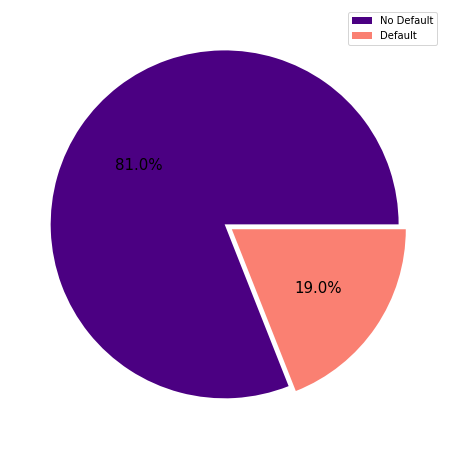

In [9]:
plt.figure(figsize=(12,8))

data['BM_15_12M'].value_counts().plot(kind='pie',labels = ['',''], autopct='%1.1f%%', colors = ['indigo','salmon'], explode = [0,0.05], textprops = {"fontsize":15})
plt.ylabel('')
plt.xlabel('')

plt.legend(labels=['No Default', 'Default'])
plt.show()

Un 18.7% del total de la muestra está dentro de default. 

In [129]:
df_201906.BM_15_12M.sum(), df_201906.shape[0]

(141506, 707416)

Un total de **141506** clientes caen en deafault de un total de **707416**

In [130]:
df_201906.isna().sum().sort_values(ascending=False)

ANTIGUEDAD_RCC             304393
ANTIGUEDAD_IBK             287168
CA_TIP_CONTRIBUYENTE       215065
SCORE_TRANSX_TC             38343
PRODUCTOS                   30137
                            ...  
TIPCLASIFRIESGOSBS              0
TIPFLGPRODUCTOOTROBANCO         0
MTODEUDAOTROBANCOSOL            0
TIPNIVELEDUCACIONAL             0
RANGO_ANTIG_RCC                 0
Length: 63, dtype: int64

Podemos ver que hay varias variables con NaN. Veamos esto más de cerca

In [5]:
df_201906 = data.copy()

In [30]:
feature_with_nan = [features for features in df_201906.columns if df_201906[features].isnull().sum() >1 ]

In [31]:
#estas son las variables con valores missings
for feature in feature_with_nan:
  print(feature, np.round((df_201906[feature].isnull().sum()/df_201906.shape[0])*100,2), '% de missings' )

SUBPRODUCTO 0.11 % de missings
SEGMENTO 0.0 % de missings
SUBSEGMENTO 0.0 % de missings
CA_TIP_CONTRIBUYENTE 30.3 % de missings
CA_SITUACION_LAB 0.11 % de missings
NE_INGR_NETO_VIG 0.11 % de missings
NE_INGR_BRUTO 0.11 % de missings
NE_INGR_ACTIVO_IND 0.11 % de missings
NIVELSCORE 4.1 % de missings
PRODUCTOS 4.13 % de missings
DI 4.91 % de missings
MODELOSCORE_PP 4.1 % de missings
MATRIZ_RIESGO 4.1 % de missings
INGRESO_VIGENTE_ACOT 4.1 % de missings
LINEA 4.13 % de missings
SUBPROD_ANALYTICS 0.11 % de missings
TRAMO_MES_ANT 2.89 % de missings
CLASIF_F_MES_ANT 3.04 % de missings
DM_MES_ANT 3.04 % de missings
DEUDA_ANT 2.89 % de missings
SCORE_TRANSX_TC 5.42 % de missings
CTDENTIDADES 0.49 % de missings
ANTIGUEDAD_IBK 40.57 % de missings
ANTIGUEDAD_RCC 43.0 % de missings


Las variables con más valores missings son PRODUCTOS, MATRIZ_RIESGO, INGRESO VIGENTE, DI y LINEA

La variable DI tiene demasiados missings por lo cual la eliminaremos para posteriormete realizar nuestra varaible deuda ingreso en base a la varaible ingreso y LINEA

In [134]:
df_201906.RANGO_ANTIG_IBK.value_counts()

[0;1]     287168
[10;+>    223145
[8;9]      93667
[6;7]      76108
[4;5]      27328
Name: RANGO_ANTIG_IBK, dtype: int64

In [8]:
#eliminamos los duplicados originados por el ccruce con mae cliente ya que los cif_key al reducirse a 10 sigitos causan esos problemas
df_201906.drop_duplicates(subset=['CIF_KEY','NROPROD'], keep= 'first', inplace=True)

In [29]:
df_201906.isnull().sum()

CODMES                          0
CIF_KEY                         0
NROPROD                         0
FLG_DESEMBOLSO                  0
BM_30_12M                       0
BM_15_12M                       0
BM_30_6M                        0
BM_15_6M                        0
EDAD                            0
EST_CIVIL                       0
GENERO                          0
CODDOCC                         0
CODCLIENTESBS                   0
PRODUCTO                        0
SUBPRODUCTO                   769
TRAMO                           0
DEUDA                           0
TIPO_PRODUCTO                   0
D_VIG                           0
REGION                          0
DEPARTAMENTO                    0
TIPO_CLIENTE_SEG                0
SEGMENTO                        6
SUBSEGMENTO                     6
TIPFLGDEPENDIENTE               0
TIPFLGPROPIETARIOCASA           0
TIPSITUACIONCASA                0
TIPCLASIFRIESGOSBS              0
TIPFLGPRODUCTOOTROBANCO         0
MTODEUDAOTROBA

* Inspeccionemos los valores de cada variable y los valores nulos

### Inspeccion de variables

In [137]:
df_201906.columns

Index(['CODMES', 'CIF_KEY', 'NROPROD', 'FLG_DESEMBOLSO', 'BM_30_12M',
       'BM_15_12M', 'BM_30_6M', 'BM_15_6M', 'EDAD', 'EST_CIVIL', 'GENERO',
       'CODDOCC', 'CODCLIENTESBS', 'PRODUCTO', 'SUBPRODUCTO', 'TRAMO', 'DEUDA',
       'TIPO_PRODUCTO', 'D_VIG', 'REGION', 'DEPARTAMENTO', 'TIPO_CLIENTE_SEG',
       'SEGMENTO', 'SUBSEGMENTO', 'TIPFLGDEPENDIENTE', 'TIPFLGPROPIETARIOCASA',
       'TIPSITUACIONCASA', 'TIPCLASIFRIESGOSBS', 'TIPFLGPRODUCTOOTROBANCO',
       'MTODEUDAOTROBANCOSOL', 'TIPNIVELEDUCACIONAL', 'CODPROFESION',
       'DESTIPCARGO', 'CA_TIP_CONTRIBUYENTE', 'CA_SITUACION_LAB',
       'NE_INGR_NETO_VIG', 'NE_INGR_BRUTO', 'NE_INGR_ACTIVO_IND', 'NIVELSCORE',
       'PRODUCTOS', 'MODELOSCORE_PP', 'MATRIZ_RIESGO', 'LINEA',
       'PROD_ANALYTICS', 'SUBPROD_ANALYTICS', 'TRAMO_ANALYTICS',
       'TRAMO_MES_ANT', 'CLASIFICACION_FINAL', 'CLASIF_F_MES_ANT',
       'DM_ANALYTICS', 'DM_MES_ANT', 'DEUDA_ANALYTICS', 'DEUDA_ANT',
       'SIT_LABORAL_CASC', 'G_INGRESO', 'SCORE_TRANSX_TC', 

#### **BM_15_12M**

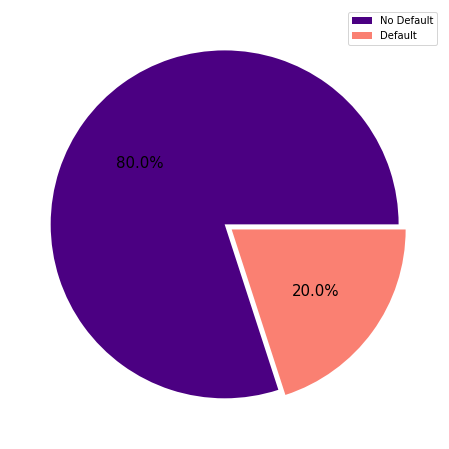

In [10]:
plt.figure(figsize=(12,8))

df_201906['BM_15_12M'].value_counts().plot(kind='pie',labels = ['',''], autopct='%1.1f%%', colors = ['indigo','salmon'], explode = [0,0.05], textprops = {"fontsize":15})
plt.ylabel('')
plt.xlabel('')

plt.legend(labels=['No Default', 'Default'])
plt.show()

* 20% de la muestra esta en el grupo de default con la varaible mas acida.  Unos 141 506

In [16]:
df_201906.BM_15_12M.value_counts()

0    565910
1    141506
Name: BM_15_12M, dtype: int64

In [10]:
df_201906.BM_15_12M.isnull().sum()
# No tiene ningun missing

0

#### **EDAD**

In [11]:

px.histogram(df_201906.EDAD)


* Hay valores outliers que pueden afectar el modelo y a la generalizacion del modelo. Edades de mas de  100 

In [173]:
df_201906.EDAD.isnull().sum()

1120

* Al ser pocos missings se puede dropear los valores por facilidad 

In [12]:
df_201906.dropna(inplace=True,axis='rows',subset=['EDAD'])

In [13]:
#LIMPIO DE MISSINGS
df_201906.EDAD.isnull().sum()

0

#### EST_CIVIL

In [14]:
df_201906.EST_CIVIL.value_counts()

S    460747
C    212920
D     24908
V      7368
Name: EST_CIVIL, dtype: int64

<AxesSubplot:xlabel='EST_CIVIL', ylabel='count'>

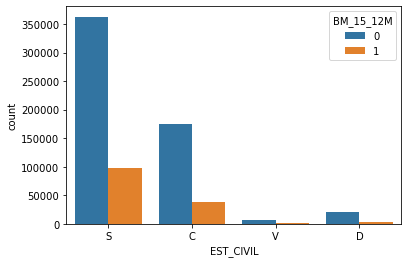

In [15]:
sns.countplot(df_201906.EST_CIVIL,hue=df_201906.BM_15_12M)

* La mayoria de los default estan en el segmento soltero y casado. Como estrategia de etiquetado agruparemos viudos y divorciados en un grupo llamado otros

In [16]:
df_201906.EST_CIVIL.isnull().sum()

353

In [17]:
#estado civil
ran_sample=df_201906['EST_CIVIL'].dropna().sample(df_201906.EST_CIVIL.isnull().sum(), random_state=0)
ran_sample.index = df_201906[df_201906['EST_CIVIL'].isnull()].index
df_201906.loc[df_201906.EST_CIVIL.isnull(),'EST_CIVIL']= ran_sample

In [18]:
df_201906.EST_CIVIL.isnull().sum()

0

In [19]:
#creamos el nuevo grupo de 'OTRO' donde agruporemos a viudo y divorciado. asimismo imputamos usando una muestra de la distribucion de las clases
est_dic = {'S':'S', 'C':'C','V':'O','D':'O'}
df_201906['EST_CIVIL']= df_201906['EST_CIVIL'].replace(est_dic)

<AxesSubplot:xlabel='EST_CIVIL', ylabel='count'>

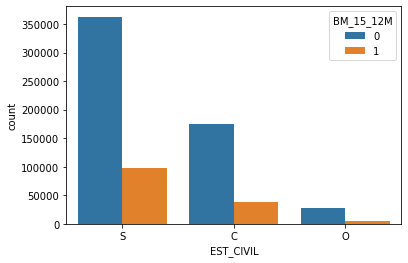

In [20]:
sns.countplot(df_201906.EST_CIVIL,hue=df_201906.BM_15_12M)

#### GENERO

In [21]:
df_201906.GENERO.value_counts()

F    360893
M    345403
Name: GENERO, dtype: int64

In [22]:
df_201906.GENERO.isnull().sum()

0

* No hay ningun missing value

In [23]:
pd.crosstab(df_201906['GENERO'], df_201906['BM_15_12M']).style.background_gradient(cmap='YlGnBu')

BM_15_12M,0,1
GENERO,,
F,290346,70547
M,274566,70837


* los valores de default por genero son bastantes parejos. A priori pidriamnos pensar que el genero no seria una vataible determinante para poder diferenfciar el default, pero eso lo veremos mas adelante con algunas pruebas

<AxesSubplot:xlabel='GENERO', ylabel='count'>

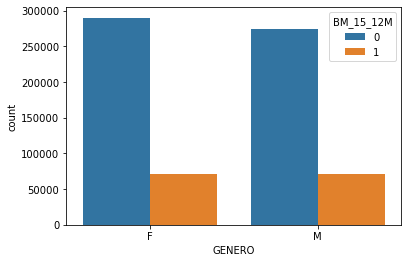

In [24]:
sns.countplot(df_201906.GENERO, hue=df_201906.BM_15_12M)

#### CA_TIP_CONTRIBUYENTE

In [52]:
df_201906.CA_TIP_CONTRIBUYENTE.isnull().sum()

214040

* Hay unos 214040 valores missings en CA_TIP_CONTRIBUYENTE

In [55]:
  print('CA_TIP_CONTRIBUYENTE', np.round((df_201906['CA_TIP_CONTRIBUYENTE'].isnull().sum()/df_201906.shape[0])*100,2), '% de missings' )

CA_TIP_CONTRIBUYENTE 30.3 % de missings


* En esta oportunidad el imputar sera demasiado complicado ya que hablamos de un poco mas de la tercera parte del total de la muestra la cual tiene valores missings.Por ese motivo eliminaresmos la variable

In [57]:
df_201906.drop(['CA_TIP_CONTRIBUYENTE'], axis=1, inplace=True)

---

#### ANTIGUEDAD_RCC y ANTIGUEDAD_IBK

* En este caso, el llenado de las variables deja el valor missing para el valor del intervalo de antiguedad **[0,1]**, por lo cual rellenaremos el valor con **0** para ambos casos

In [60]:
df_201906.ANTIGUEDAD_RCC.fillna(0, inplace=True)

In [61]:
df_201906.ANTIGUEDAD_IBK.fillna(0, inplace=True)

In [62]:
df_201906.ANTIGUEDAD_RCC.isnull().sum(), df_201906.ANTIGUEDAD_IBK.isnull().sum()

(0, 0)

* YA no tenemos valores missing en estas 2 variables

#### **SCORE_TRANSX_TC**

In [63]:
df_201906.SCORE_TRANSX_TC.value_counts()

ALTO        151375
BAJO        129126
MUY ALTO    125568
MEDIO       108579
MUY BAJO    105405
RECHAZO      47938
Name: SCORE_TRANSX_TC, dtype: int64

In [76]:
df_201906.SCORE_TRANSX_TC.isnull().sum()

38305

In [65]:
  print('SCORE_TRANSX_TC', np.round((df_201906['SCORE_TRANSX_TC'].isnull().sum()/df_201906.shape[0])*100,2), '% de missings' )

SCORE_TRANSX_TC 5.42 % de missings


<AxesSubplot:xlabel='SCORE_TRANSX_TC', ylabel='count'>

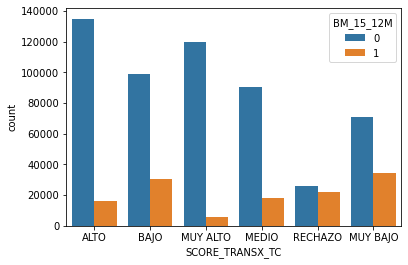

In [67]:
sns.countplot(df_201906.SCORE_TRANSX_TC, hue=df_201906.BM_15_12M)

* Rellenamos los missings coon una muestra elatoria de la distribucin no missing para mantener la distribucion original

In [80]:
ran_sample=df_201906['SCORE_TRANSX_TC'].dropna().sample(df_201906.SCORE_TRANSX_TC.isnull().sum(), random_state=0)
ran_sample.index = df_201906[df_201906['SCORE_TRANSX_TC'].isnull()].index
df_201906.loc[df_201906.SCORE_TRANSX_TC.isnull(),'SCORE_TRANSX_TC']= ran_sample

<AxesSubplot:xlabel='SCORE_TRANSX_TC', ylabel='count'>

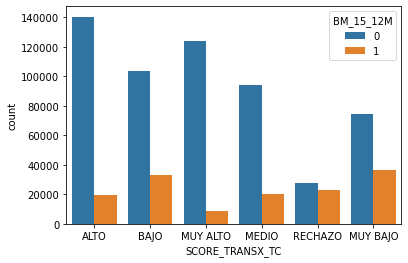

In [81]:
sns.countplot(df_201906.SCORE_TRANSX_TC, hue=df_201906.BM_15_12M)

---

#### **Drop varaibles que no usaremos**

In [85]:
df_201906.drop(['DI','NE_INGR_ACTIVO_IND','CODMES','NE_INGR_BRUTO'], axis=1, inplace=True)

In [87]:
df_201906.drop(['CIF_KEY','NROPROD'], axis=1, inplace=True)

---

#### **PRODUCTOS**

In [98]:
df_201906.PRODUCTOS.value_counts()

0        623474
TC+CD     27511
TC        26160
Name: PRODUCTOS, dtype: int64

In [100]:
df_201906.PRODUCTOS.isnull().sum()

29151

<AxesSubplot:xlabel='PRODUCTOS', ylabel='count'>

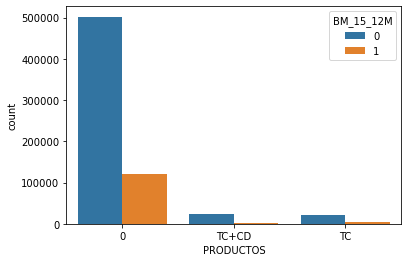

In [97]:
sns.countplot(df_201906.PRODUCTOS, hue=df_201906.BM_15_12M)

* El conteo de la variable **PRODUCTO** a primera vista no nos permite obterner algun razgo amrcado ya que hay una concentracion en el producto VISA, el cual abarca la mayoria de default. En este caso por convenviencia no usaremos esta variable

In [107]:
df_201906.loc[df_201906.PRODUCTOS.isnull(),]

,FLG_DESEMBOLSO,BM_30_12M,BM_15_12M,BM_30_6M,BM_15_6M,EDAD,EST_CIVIL,GENERO,CODDOCC,CODCLIENTESBS,SUBPRODUCTO,TRAMO,DEUDA,TIPO_PRODUCTO,D_VIG,REGION,DEPARTAMENTO,TIPO_CLIENTE_SEG,SEGMENTO,SUBSEGMENTO,TIPFLGDEPENDIENTE,TIPFLGPROPIETARIOCASA,TIPSITUACIONCASA,TIPCLASIFRIESGOSBS,TIPFLGPRODUCTOOTROBANCO,MTODEUDAOTROBANCOSOL,TIPNIVELEDUCACIONAL,CODPROFESION,DESTIPCARGO,CA_SITUACION_LAB,NE_INGR_NETO_VIG,NIVELSCORE,PRODUCTOS,MODELOSCORE_PP,MATRIZ_RIESGO,INGRESO_VIGENTE_ACOT,LINEA,PROD_ANALYTICS,SUBPROD_ANALYTICS,TRAMO_ANALYTICS,TRAMO_MES_ANT,CLASIFICACION_FINAL,CLASIF_F_MES_ANT,DM_ANALYTICS,DM_MES_ANT,DEUDA_ANALYTICS,DEUDA_ANT,SIT_LABORAL_CASC,G_INGRESO,SCORE_TRANSX_TC,TASA_DET,CTDACTIVOS,CTDENTIDADES,ANTIGUEDAD_IBK,RANGO_ANTIG_IBK,ANTIGUEDAD_RCC,RANGO_ANTIG_RCC
9,0,0,0,0,0,51.0,C,F,16009435,0104301495,Visa Oro,Vig,368.64,TRADICIONAL,368.64,1,15,3,3,MICRO,.,N,FAMIL,0,S,1096.38,17,.,.,INDEPENDIENTE,2662.0,NaN,NaN,NaN,NaN,NaN,NaN,01 Visa,Visa Oro,Vig,Vig,0,0.0,0,0.0,368.64,4.96,INDEPENDIENTE,"03. <=3,974",RECHAZO,02.MANTIENE,1,5.0,0.0,[0;1],8.0,[6;+>
13,0,0,0,0,0,40.0,S,F,44606606,.,Interbank Premia,Vig,1037.91,TRADICIONAL,1037.91,1,15,3,1BC,SIN SUBSEGMENTO,.,.,.,.,N,0.00,.,.,.,INDEPENDIENTE,1876.0,NaN,NaN,NaN,NaN,NaN,NaN,01 Visa,Interbank Premia,Vig,Vig,0,0.0,0,0.0,1037.91,962.02,INDEPENDIENTE,"06. >12,660",MUY ALTO,02.MANTIENE,1,7.0,14.0,[10;+>,13.0,[6;+>
21,0,1,1,1,1,44.0,C,F,22075934,0153370559,Interbank Premia,Vig,1195.86,TRADICIONAL,1195.86,5,11,3,3,MICRO,S,N,FAMIL,4,N,0.00,17,NEG,INFORMAL,INDEPENDIENTE,1358.0,NaN,NaN,NaN,NaN,NaN,NaN,01 Visa,Interbank Premia,Vig,Vig,0,0.0,0,0.0,1195.86,1199.63,INDEPENDIENTE,"02. <=2,480",MUY BAJO,02.MANTIENE,1,4.0,0.0,[0;1],0.0,[0]
36,0,1,1,1,1,32.0,S,F,45561990,0157636995,Visa Clásica Internacional,Vig,939.28,TRADICIONAL,939.28,4,16,3,3,MICRO,S,S,PROPI,4,N,0.00,17,VEN,DEPENDIENTE,MIXTO,2662.0,NaN,NaN,NaN,NaN,NaN,NaN,01 Visa,Visa Clásica Internacional,Vig,NaN,0,NaN,0,NaN,939.28,NaN,MIXTO,"03. <=3,974",MUY ALTO,06.NUEVO,1,2.0,7.0,[6;7],0.0,[0]
69,0,1,1,1,1,45.0,S,M,21560775,0078786248,Visa Oro,Vig,42439.13,TRADICIONAL,42439.13,1,15,3,3,PNSN,S,S,PROPI,4,N,0.00,17,PRF,DEPENDIENTE,INDEPENDIENTE,3752.0,NaN,NaN,NaN,NaN,NaN,NaN,01 Visa,Visa Oro,Vig,Vig,0,0.0,0,0.0,42439.13,42214.18,INDEPENDIENTE,"04. <=7,020",ALTO,02.MANTIENE,2,3.0,9.0,[8;9],6.0,[6;+>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
844044,0,0,0,0,0,41.0,S,M,43900404,.,Mastercard Oro,Vig,700.11,TRADICIONAL,700.11,1,15,3,4,SIN SUBSEGMENTO,.,.,.,.,N,0.00,.,.,.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,01 Mastercard,Mastercard Oro,Vig,Vig,0,0.0,0,0.0,700.11,87.24,SIN_CASCADA,9.N.D.,MEDIO,02.MANTIENE,1,1.0,20.0,[10;+>,13.0,[6;+>
844245,0,0,0,0,0,49.0,S,F,09590690,.,Vivanda Platinum,Vig,2471.60,PREMIUM,2471.60,1,15,3,6,SIN SUBSEGMENTO,.,.,.,.,N,0.00,.,.,.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,01 Vivanda Amex,Vivanda Platinum,Vig,Vig,0,0.0,0,0.0,2471.60,3667.89,SIN_CASCADA,9.N.D.,MUY ALTO,02.MANTIENE,1,1.0,13.0,[10;+>,12.0,[6;+>
845342,0,0,0,0,0,78.0,C,M,17957680,.,Visa Oro,Vig,1942.58,TRADICIONAL,1942.58,1,15,3,6,SIN SUBSEGMENTO,.,.,.,.,N,0.00,.,.,.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,01 Visa,Visa Oro,Vig,Vig,0,0.0,0,0.0,1942.58,3141.89,SIN_CASCADA,9.N.D.,MUY ALTO,02.MANTIENE,1,4.0,14.0,[10;+>,13.0,[6;+>
846777,0,0,0,0,0,62.0,C,F,00920511,.,Visa Signature,Vig,17753.30,PREMIUM,17753.30,1,15,3,6,SIN SUBSEGMENTO,.,.,.,.,N,0.00,.,.,.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,01 Visa,Visa Signature,Vig,Vig,0,0.0,0,0.0,17753.30,16668.78,SIN_CASCADA,9.N.D.,MUY ALTO,02.MANTIENE,1,1.0,19.0,[10;+>,13.0,[6;+>


* Explorando las variables podemos ver que hay unas observaciones que agrupan en total varios missings en otras varaibles como **LINEA, NIVELSCORE, MODELOSCORE_PP, MATRIZ_RIESGO**. Se prodecera a eliminar estas observaciones

In [109]:
df_201906.dropna(axis='rows',inplace=True, subset=['PRODUCTOS'])

In [96]:
df_201906.drop(['PRODUCTO'], axis=1, inplace=True)

In [112]:
df_201906.shape

(677145, 57)

In [372]:
data.CA_SITUACION_LAB.value_counts()

INDEPENDIENTE    398083
MIXTO            236390
DEPENDIENTE      136399
Name: CA_SITUACION_LAB, dtype: int64

In [374]:
data.TIPFLGPROPIETARIOCASA.value_counts()

N    586357
.    152056
S    121730
Name: TIPFLGPROPIETARIOCASA, dtype: int64

In [371]:
df_201906.TIPFLGPROPIETARIOCASA.value_counts()

3    277898
2    196368
1    110559
Name: CA_SITUACION_LAB, dtype: int64

In [370]:
X.CA_SITUACION_LAB.value_counts()

3    277898
2    196368
1    110559
Name: CA_SITUACION_LAB, dtype: int64

---

In [113]:
df_201906.dropna(axis='rows',inplace=True, subset=['CLASIF_F_MES_ANT'])

In [116]:
df_201906.dropna(inplace=True, axis='rows')

In [120]:
df_201906.shape

(655630, 57)

* Despues de hacer la limpieza de los datos no quedamos finalmente con **655 630** observaciones

---

### **Labeling**

In [121]:
df_201906.columns

Index(['FLG_DESEMBOLSO', 'BM_30_12M', 'BM_15_12M', 'BM_30_6M', 'BM_15_6M',
       'EDAD', 'EST_CIVIL', 'GENERO', 'CODDOCC', 'CODCLIENTESBS',
       'SUBPRODUCTO', 'TRAMO', 'DEUDA', 'TIPO_PRODUCTO', 'D_VIG', 'REGION',
       'DEPARTAMENTO', 'TIPO_CLIENTE_SEG', 'SEGMENTO', 'SUBSEGMENTO',
       'TIPFLGDEPENDIENTE', 'TIPFLGPROPIETARIOCASA', 'TIPSITUACIONCASA',
       'TIPCLASIFRIESGOSBS', 'TIPFLGPRODUCTOOTROBANCO', 'MTODEUDAOTROBANCOSOL',
       'TIPNIVELEDUCACIONAL', 'CODPROFESION', 'DESTIPCARGO',
       'CA_SITUACION_LAB', 'NE_INGR_NETO_VIG', 'NIVELSCORE', 'PRODUCTOS',
       'MODELOSCORE_PP', 'MATRIZ_RIESGO', 'INGRESO_VIGENTE_ACOT', 'LINEA',
       'PROD_ANALYTICS', 'SUBPROD_ANALYTICS', 'TRAMO_ANALYTICS',
       'TRAMO_MES_ANT', 'CLASIFICACION_FINAL', 'CLASIF_F_MES_ANT',
       'DM_ANALYTICS', 'DM_MES_ANT', 'DEUDA_ANALYTICS', 'DEUDA_ANT',
       'SIT_LABORAL_CASC', 'G_INGRESO', 'SCORE_TRANSX_TC', 'TASA_DET',
       'CTDACTIVOS', 'CTDENTIDADES', 'ANTIGUEDAD_IBK', 'RANGO_ANTIG_IBK',
    

In [135]:
df_201906.drop(['CODDOCC', 'CODCLIENTESBS'], axis= 'columns', inplace=True)

In [127]:
#limpiaremos los outliers de las variables numericas: EDAD
df_201906 =df_201906.query(" 20<EDAD< 65 ")


In [133]:
#genero labelingd
gen_dic ={'M':2,'F':1}
df_201906['GENERO'] = df_201906.GENERO.replace(gen_dic)

In [138]:
est_dic ={'S':3,'C':2,'O':1}
df_201906['EST_CIVIL']=df_201906.EST_CIVIL.replace(est_dic)

In [152]:
prod_ana_dict = {'01 Visa': 3, '01 Amex':2,'01 CashBack':1,'01 Mastercard':1,'01 Vivanda Amex':1, '01 LifeMiles Amex':1,'01 Aval':1,'01 Vea Visa': 1,'01 Megaplaza':1}
df_201906['PROD_ANALYTICS'] = df_201906.PROD_ANALYTICS.replace(prod_ana_dict)

In [206]:
propcasa_dic ={ 'N':3,'S':1,'.':2}
df_201906['TIPFLGPROPIETARIOCASA']=df_201906.TIPFLGPROPIETARIOCASA.replace(propcasa_dic)

In [153]:
df_201906.PROD_ANALYTICS.value_counts()

3    422389
2    146332
1     35882
Name: PROD_ANALYTICS, dtype: int64

In [155]:
df_201906.TRAMO.value_counts()

Vig    604603
Name: TRAMO, dtype: int64

* La varaible subproducto tiene demasiadas categorias por lo cual no se usara

In [ ]:
no_usar = ['SUBPRODUCTO','TRAMO','REGION','DEPARTAMENTO','SEGMENTO']

<AxesSubplot:xlabel='TIPCLASIFRIESGOSBS', ylabel='count'>

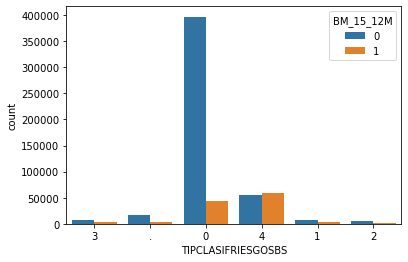

In [219]:
sns.countplot(df_201906.TIPCLASIFRIESGOSBS, hue= df_201906.BM_15_12M)

In [214]:
df_201906.TIPSITUACIONCASA.unique()

array([2, '.    ', 1, 3, 'P    ', 'X    '], dtype=object)

In [224]:
df_201906.query("TIPCLASIFRIESGOSBS != '.' ", inplace=True)

In [216]:
sit_casa_dict = {2:2,3:3,'.    ':1,1:1,'P    ':1,'X    ':1}
df_201906['TIPSITUACIONCASA']= df_201906.TIPSITUACIONCASA.replace(sit_casa_dict)

In [228]:
df_201906['TIPFLGPRODUCTOOTROBANCO'] = df_201906.TIPFLGPRODUCTOOTROBANCO.replace({'S':2,'N':1})

In [235]:
df_201906['TIPNIVELEDUCACIONAL'] = df_201906.TIPNIVELEDUCACIONAL.replace({'14':3, '17':3, '18':3, '.':2, '11':1, '06':1, '19':3, '00':3})

In [252]:
df_201906['NIVELSCORE'] = df_201906.NIVELSCORE.replace({'Muy Alto':1, 'Alto':2,'Medio':3, 'Bajo':4,'Rechazo':5})

In [256]:
df_201906['PRODUCTOS'] = df_201906.PRODUCTOS.replace({'0':0, 'TC+CD':2, 'TC':1})

In [273]:
df_201906['LINEA'] = np.log(df_201906.LINEA)

In [287]:
df_201906['TASA_DET'] =df_201906.TASA_DET.replace({'02.MANTIENE':2, '01.RECUPERA':1})

In [298]:
df_201906['CTDACTIVOS']=df_201906.CTDACTIVOS.replace({1:1, 2:2, 3:2, 4:2})

In [302]:
df_201906.CTDENTIDADES.value_counts()

3.0     134611
4.0     128990
2.0     100171
5.0      92303
1.0      54758
6.0      49485
7.0      18609
8.0       4784
9.0        933
10.0       165
11.0        15
12.0         1
Name: CTDENTIDADES, dtype: int64

In [303]:
df_201906.CTDENTIDADES.dtypes

dtype('float64')

<AxesSubplot:xlabel='CTDENTIDADES', ylabel='count'>

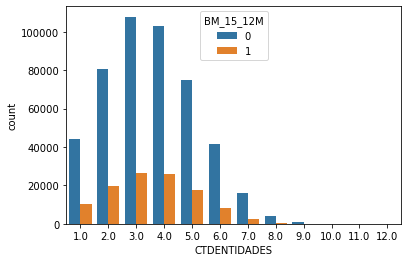

In [301]:
sns.countplot(df_201906.CTDENTIDADES, hue=df_201906.BM_15_12M)

In [300]:
df_201906.CTDENTIDADES.unique()

array([ 4.,  5.,  2.,  8.,  3.,  1.,  6.,  7., 10.,  9., 11., 12.])

In [136]:
df_201906.columns

Index(['FLG_DESEMBOLSO', 'BM_30_12M', 'BM_15_12M', 'BM_30_6M', 'BM_15_6M',
       'EDAD', 'EST_CIVIL', 'GENERO', 'SUBPRODUCTO', 'TRAMO', 'DEUDA',
       'TIPO_PRODUCTO', 'D_VIG', 'REGION', 'DEPARTAMENTO', 'TIPO_CLIENTE_SEG',
       'SEGMENTO', 'SUBSEGMENTO', 'TIPFLGDEPENDIENTE', 'TIPFLGPROPIETARIOCASA',
       'TIPSITUACIONCASA', 'TIPCLASIFRIESGOSBS', 'TIPFLGPRODUCTOOTROBANCO',
       'MTODEUDAOTROBANCOSOL', 'TIPNIVELEDUCACIONAL', 'CODPROFESION',
       'DESTIPCARGO', 'CA_SITUACION_LAB', 'NE_INGR_NETO_VIG', 'NIVELSCORE',
       'PRODUCTOS', 'MODELOSCORE_PP', 'MATRIZ_RIESGO', 'INGRESO_VIGENTE_ACOT',
       'LINEA', 'PROD_ANALYTICS', 'SUBPROD_ANALYTICS', 'TRAMO_ANALYTICS',
       'TRAMO_MES_ANT', 'CLASIFICACION_FINAL', 'CLASIF_F_MES_ANT',
       'DM_ANALYTICS', 'DM_MES_ANT', 'DEUDA_ANALYTICS', 'DEUDA_ANT',
       'SIT_LABORAL_CASC', 'G_INGRESO', 'SCORE_TRANSX_TC', 'TASA_DET',
       'CTDACTIVOS', 'CTDENTIDADES', 'ANTIGUEDAD_IBK', 'RANGO_ANTIG_IBK',
       'ANTIGUEDAD_RCC', 'RANGO_ANTIG_R

In [304]:
features =['EST_CIVIL','PROD_ANALYTICS','GENERO','EDAD','TIPO_CLIENTE_SEG','TIPFLGPROPIETARIOCASA','TIPSITUACIONCASA','TIPCLASIFRIESGOSBS',
'TIPFLGPRODUCTOOTROBANCO','MTODEUDAOTROBANCOSOL','TIPNIVELEDUCACIONAL','CA_SITUACION_LAB','NIVELSCORE','PRODUCTOS','MODELOSCORE_PP','LINEA','TASA_DET','CTDACTIVOS','CTDENTIDADES',
'ANTIGUEDAD_IBK','ANTIGUEDAD_RCC']
target = ['BM_15_12M']

In [305]:
X = df_201906[features]
y = df_201906[target]

In [324]:
for i in X.select_dtypes(include='object').columns:
    X[i]=X[i].astype('category')

In [327]:
X['TIPCLASIFRIESGOSBS'] = X['TIPCLASIFRIESGOSBS'].astype('int')

---

## **Modelling**

In [309]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, make_scorer
from sklearn.metrics import roc_auc_score, roc_curve, f1_score,precision_score,recall_score, plot_confusion_matrix
# import eli5
# from eli5.sklearn import PermutationImportance
from sklearn import tree
# import graphviz
# from pdpbox import dp, get_dataset, info_plots
# import shap

In [319]:
import eli5 
from eli5.sklearn import PermutationImportance
import graphviz
from pdpbox import pdp, get_dataset, info_plots
import shap
from sklearn.metrics import f1_score
import xgboost


In [330]:
#train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)


---
opt


In [382]:
from hyperopt import hp
import numpy as np

space= {
    'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(1)),
    'max_depth': hp.quniform('max_depth', 5, 15, 1),
    'n_estimators': hp.quniform('n_estimators', 5, 35, 1),
    'num_leaves': hp.quniform('num_leaves', 5, 50, 1),
    'boosting_type': hp.choice('boosting_type', ['gbdt', 'dart']),
    'colsample_bytree': hp.uniform('colsample_by_tree', 0.6, 1.0),
    'reg_lambda': hp.uniform('reg_lambda', 0.0, 1.0),
}

In [381]:
from sklearn.model_selection import cross_val_score
from hyperopt import STATUS_OK
import lightgbm as lgb

In [384]:
from hyperopt import Trials

trials = Trials()



In [385]:
from hyperopt import tpe

tpe_algorithm = tpe.suggest

In [383]:
def objective_function(params):
    clf = lgb.LGBMClassifier(**params)
    score = cross_val_score(clf, X_train, y_train, cv=5).mean()
    return {'loss': -score, 'status': STATUS_OK}  

In [386]:
from hyperopt import fmin, tpe, Trials

import numpy as np

num_eval = 500

trials = Trials()

best_param = fmin(objective_function, space, algo=tpe.suggest, max_evals=num_eval, trials=trials, rstate= np.random.RandomState(1))

100%|██████████| 500/500 [04:53<00:00,  1.70trial/s, best loss=?]


AllTrialsFailed: 

In [331]:
model = xgboost.XGBClassifier( ).fit(X_train, y_train)

predict = model.predict(X_test)

[18:33:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [334]:
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix

In [332]:
from sklearn.metrics import f1_score

f1 = f1_score(y_test, predict)
f1

0.479666801642853

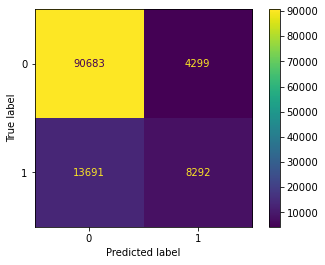

In [335]:
plot_confusion_matrix(model, X_test, y_test)


In [342]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer(X)

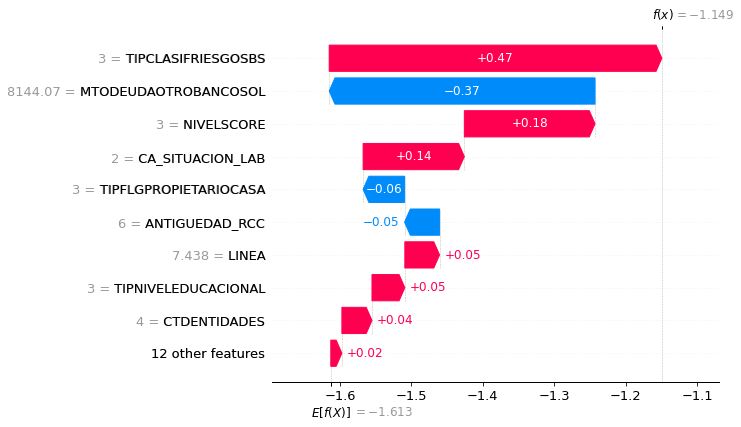

In [343]:
shap.plots.waterfall(shap_values[0])


In [375]:
data.PROD_ANALYTICS.value_counts()

01 Visa              592150
01 Amex              204787
01 CashBack           31410
01 Mastercard         22138
01 Vivanda Amex        9028
01 LifeMiles Amex       312
01 Aval                 192
01 Vea Visa             122
01 Megaplaza              4
Name: PROD_ANALYTICS, dtype: int64

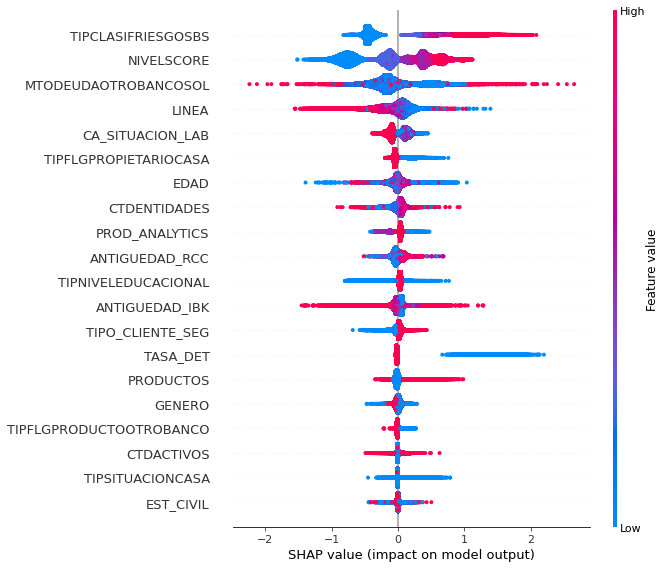

In [344]:
shap.summary_plot(shap_values, X)


In [376]:
data.ANTIGUEDAD_IBK.value_counts()

11.0    64908
10.0    61243
8.0     52759
9.0     52086
12.0    45744
13.0    43461
7.0     42918
14.0    39690
6.0     39011
5.0     29175
15.0    23829
16.0    20230
17.0     9235
18.0     6396
20.0     5552
19.0     4804
23.0     3955
21.0     2781
22.0     2388
24.0     2365
26.0     1239
25.0     1034
28.0      885
27.0      592
29.0      288
31.0      147
30.0      134
32.0       73
34.0       27
33.0       23
35.0       10
36.0        8
37.0        5
38.0        3
Name: ANTIGUEDAD_IBK, dtype: int64

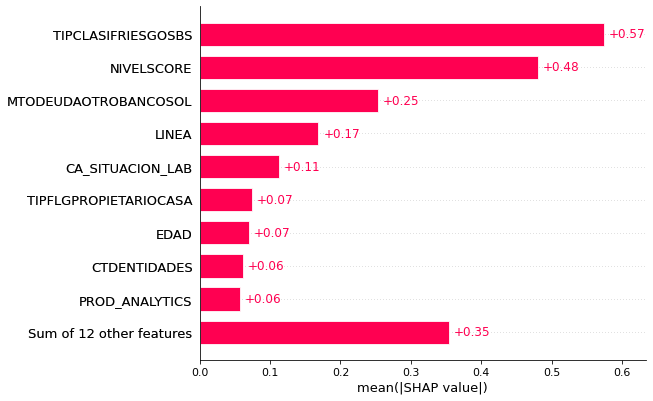

In [345]:
shap.plots.bar(shap_values)


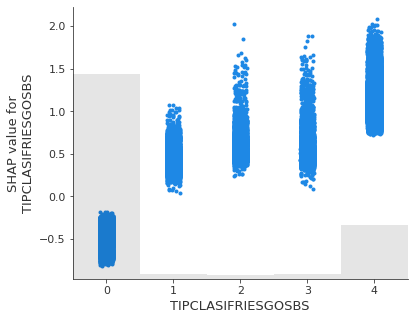

In [346]:
shap.plots.scatter(shap_values[:, "TIPCLASIFRIESGOSBS"])

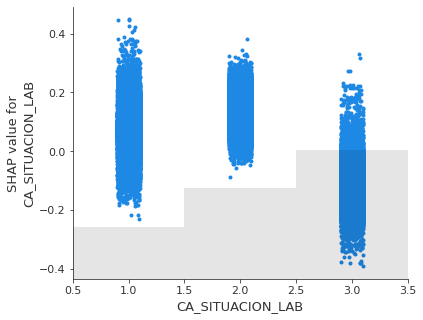

In [351]:
shap.plots.scatter(shap_values[:, "CA_SITUACION_LAB"])

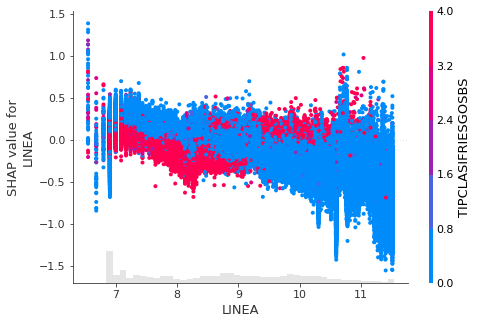

In [352]:
shap.plots.scatter(shap_values[:, "LINEA"], color=shap_values)


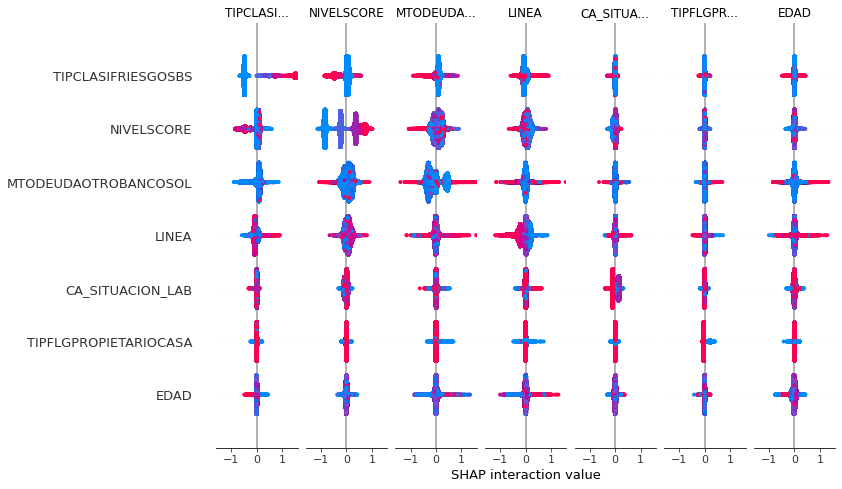

In [353]:
# Get interaction values
shap_interaction_values = explainer.shap_interaction_values(X)

# Summarize the interaction values
shap.summary_plot(shap_interaction_values, X)

In [355]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import RandomForestClassifier
# define dataset
# X, y = make_classification(n_samples=1000, n_features=20, n_informative=15, n_redundant=5, random_state=3)
# define the model
rdf = RandomForestClassifier()
# evaluate the model
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(rdf, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))
## Tomó 1h 3m correr el modelo, sin GridSearchCV

Accuracy: 0.840 (0.001)


,EST_CIVIL,PROD_ANALYTICS,GENERO,EDAD,TIPO_CLIENTE_SEG,TIPFLGPROPIETARIOCASA,TIPSITUACIONCASA,TIPCLASIFRIESGOSBS,TIPFLGPRODUCTOOTROBANCO,MTODEUDAOTROBANCOSOL,TIPNIVELEDUCACIONAL,CA_SITUACION_LAB,NIVELSCORE,PRODUCTOS,MODELOSCORE_PP,LINEA,TASA_DET,CTDACTIVOS,CTDENTIDADES,ANTIGUEDAD_IBK,ANTIGUEDAD_RCC
1,3,3,2,44.0,3,3,2,3,2,8144.07,3,2,3,0,1,7.438384,2,1,4.0,0.0,6.0
3,3,2,2,34.0,3,3,2,0,2,8734.83,3,2,3,0,1,7.090077,1,1,5.0,0.0,0.0
4,2,3,1,50.0,2,3,2,0,2,3487.16,3,2,1,0,1,8.779557,2,1,2.0,8.0,8.0
5,3,2,2,32.0,3,3,2,0,2,49762.95,3,3,3,0,1,7.937375,2,1,8.0,8.0,8.0
6,2,3,2,60.0,2,3,2,0,2,429.80,3,1,3,0,1,7.244228,2,1,2.0,8.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853420,2,3,2,40.0,3,3,2,4,2,2412.93,3,2,3,0,1,7.170120,2,2,6.0,10.0,10.0
854370,3,2,1,33.0,3,3,2,4,2,28682.17,3,2,3,0,1,7.863267,2,1,3.0,0.0,0.0
854374,3,3,2,52.0,2,3,2,0,2,3828.96,3,1,3,0,1,8.779557,2,1,5.0,16.0,9.0
854376,3,3,1,58.0,3,3,2,0,2,8735.21,2,3,2,0,1,9.392662,2,1,2.0,9.0,9.0


In [356]:
my_model = RandomForestClassifier(n_estimators=100,
                                  random_state=0).fit(X_train  , y_train)

In [367]:
perm = PermutationImportance(model, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0265 ± 0.0005,MTODEUDAOTROBANCOSOL
0.0245 ± 0.0007,TIPCLASIFRIESGOSBS
0.0154 ± 0.0007,NIVELSCORE
0.0071 ± 0.0008,LINEA
0.0014 ± 0.0004,EDAD
0.0013 ± 0.0003,TASA_DET
0.0010 ± 0.0002,TIPFLGPRODUCTOOTROBANCO
0.0007 ± 0.0003,ANTIGUEDAD_RCC
0.0006 ± 0.0003,TIPNIVELEDUCACIONAL
0.0005 ± 0.0006,ANTIGUEDAD_IBK


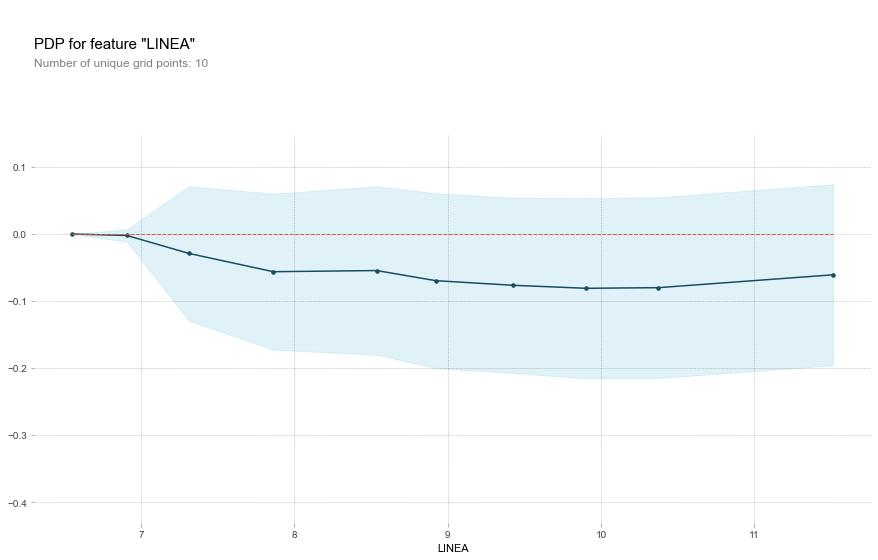

In [364]:

pdp_goals = pdp.pdp_isolate(model=my_model, dataset=X_test, model_features=X.columns, feature='LINEA')

# plot it
pdp.pdp_plot(pdp_goals, 'LINEA')
plt.show()

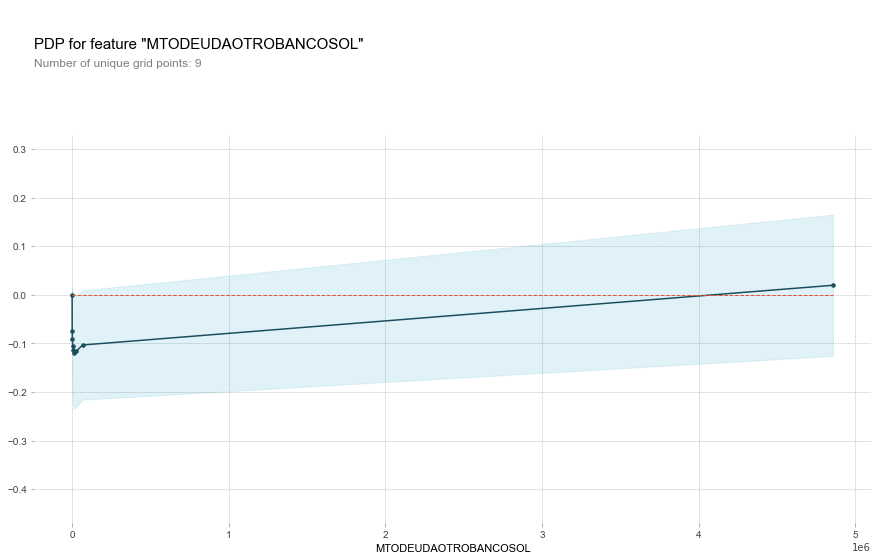

In [365]:

pdp_goals = pdp.pdp_isolate(model=my_model, dataset=X_test, model_features=X.columns, feature='MTODEUDAOTROBANCOSOL')

# plot it
pdp.pdp_plot(pdp_goals, 'MTODEUDAOTROBANCOSOL')
plt.show()

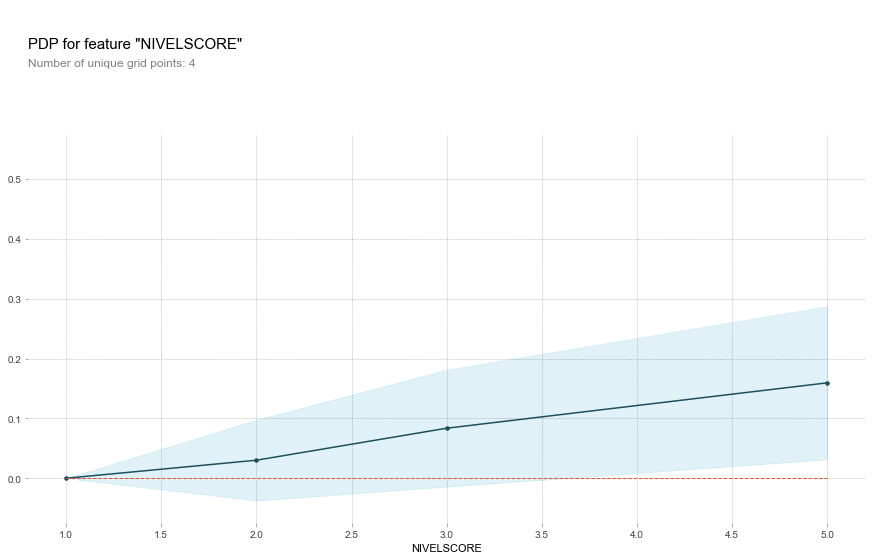

In [366]:
pdp_goals = pdp.pdp_isolate(model=my_model, dataset=X_test, model_features=X.columns, feature='NIVELSCORE')

# plot it
pdp.pdp_plot(pdp_goals, 'NIVELSCORE')
plt.show()

## **optimizacion**


In [387]:
import pandas as pd


# import numpy for Scientific computations
import numpy as np


# import machine learning libraries
import xgboost as xgb
from sklearn.metrics import accuracy_score


# import packages for hyperparameters tuning
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


In [388]:
space={'max_depth': hp.quniform("max_depth", 3, 18, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

In [392]:
def objective(space):
    clf=xgb.XGBClassifier(
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
    
    evaluation = [( X_train, y_train), ( X_test, y_test)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)
    

    pred = clf.predict(X_test)
    f1 = f1_score(y_test, pred)
    accuracy = accuracy_score(y_test, pred>0.5)
    print ("SCORE:", accuracy)
    print('F1',f1)
    return {'loss': -accuracy, 'f1': f1, 'status': STATUS_OK }

In [393]:
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

SCORE:
0.8435514897618945
F1
0.47342522517337626
SCORE:
0.8435942375924422
F1
0.47364483830130044
SCORE:
0.8436027871585517
F1
0.4737493167630391
SCORE:
0.8435942375924422
F1
0.4737962377035035
SCORE:
0.8436198862907708
F1
0.4748944965980536
SCORE:
0.8436540845552088
F1
0.4738311034383542
SCORE:
0.8436626341213184
F1
0.4736023950716794
SCORE:
0.8436626341213184
F1
0.47441940676017474
SCORE:
0.843542940195785
F1
0.47453052317234246
SCORE:
0.8436968323857564
F1
0.47555938037865747
SCORE:
0.8437310306501945
F1
0.47510194704497155
SCORE:
0.8438507245757277
F1
0.47658623259013005
SCORE:
0.843722481084085
F1
0.47384934227569725
SCORE:
0.8436968323857564
F1
0.4744135234590617
SCORE:
0.8436198862907708
F1
0.47504520276669626
SCORE:
0.8435771384602232
F1
0.4741319843642216
SCORE:
0.843508741931347
F1
0.47480775852174906
SCORE:
0.8435771384602232
F1
0.4741319843642216
SCORE:
0.8436455349890993
F1
0.4739990796134377
SCORE:
0.8435343906296755
F1
0.47454707284159753
SCORE:
0.8437823280468516
F1
0.4

In [394]:
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

The best hyperparameters are :  

{'colsample_bytree': 0.9468147294758706, 'gamma': 3.478120589105407, 'max_depth': 9.0, 'min_child_weight': 0.0, 'reg_alpha': 63.0, 'reg_lambda': 0.3966964133945987}
